# MLP Model for Gaze+BERT embeddings ()

## gaze selection is from  ['IA_FIXATION_%', 'IA_DWELL_TIME_%', 'IA_MIN_FIX_PUPIL_SIZE', 'IA_FIRST_RUN_FIXATION_%']#, 'IA_RUN_COUNT'] ## a small set for trying out

    

## Setup

---------------------
## hatespeech

In [169]:
# GPU Settings
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
 
# The GPU id to use, usually either "0" or "1";
os.environ["CUDA_VISIBLE_DEVICES"]="0"

In [170]:
# import packages
from ast import literal_eval
import pandas as pd
import numpy as np
from sklearn.metrics import classification_report
import random
import torch

import json


from tqdm import tqdm

from torch.nn import functional as F
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

import tensorflow as tf
import keras
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Sequential
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Embedding, LSTM, Dense
import keras_tuner as kt
from keras.callbacks import EarlyStopping

import tensorflow as tf

from torch.nn.utils.rnn import pad_sequence


from keras.preprocessing.text import Tokenizer

from keras.layers import Concatenate, Dense, Input, LSTM, Embedding, Dropout, Activation, GRU, Flatten
from keras.layers import Bidirectional, GlobalMaxPool1D
from keras.models import Model, Sequential
from keras.layers import Convolution1D
from keras import initializers, regularizers, constraints, optimizers, layers

# Import necessary libraries
from sklearn.neural_network import MLPClassifier
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns


pd.set_option('display.max_columns', None)
pd.options.mode.chained_assignment = None


import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
plt.rcParams['figure.figsize'] = [50, 10]


# check keras version
print('Keras Version:', keras.__version__)
print('CUDA installation:', tf.test.is_built_with_cuda())

# Set a random seed
random_seed = 42
random.seed(random_seed)
 
# Set a random seed for PyTorch (for GPU as well)
torch.manual_seed(random_seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(random_seed)



Keras Version: 2.15.0
CUDA installation: True


In [171]:
y_col='Intensity_Category_Binary'

condition="participant"
path= "pts" #or "pts_rt" pr #"pts_rv"
bert_type = 'base'  #['base', 'finetuned']
  

In [172]:
train= pd.read_csv(condition+'/train.csv')#, index_col=False)
val= pd.read_csv(condition+'/val.csv')#, index_col=False)
test= pd.read_csv(condition+'/test.csv')#, index_col=False)
len(train)

2772

In [173]:
def check_gold_labels_annotations(df):
    
    df['Gold_and_Intensity_Binary'] = 2 ##for the unaligned conditions
    
    df.loc[(df['Intensity_Category_Binary']==1) & (df['cond_remark']=='hate_w_high'), 'Gold_and_Intensity_Binary']= 1
    df.loc[(df['Intensity_Category_Binary']==1) & (df['cond_remark']=='hate_w_med'), 'Gold_and_Intensity_Binary']= 1
    df.loc[(df['Intensity_Category_Binary']==1) & (df['cond_remark']=='hate_m'), 'Gold_and_Intensity_Binary']= 1
    df.loc[(df['Intensity_Category_Binary']==0) & (df['cond_remark']=='no_hate_w'), 'Gold_and_Intensity_Binary']= 0
    df.loc[(df['Intensity_Category_Binary']==0) & (df['cond_remark']=='pos_w'), 'Gold_and_Intensity_Binary']= 0
    df.loc[(df['Intensity_Category_Binary']==0) & (df['cond_remark']=='neutral_w'), 'Gold_and_Intensity_Binary']= 0
    
    mismatch_index_list= df[df['Gold_and_Intensity_Binary']==2].index.tolist()
    print(len(df), len(mismatch_index_list))
 
    return mismatch_index_list

In [174]:
train_mismatch_index_list= check_gold_labels_annotations(train)
test_mismatch_index_list= check_gold_labels_annotations(test)
val_mismatch_index_list= check_gold_labels_annotations(val)

2772 524
598 114
246 62


In [175]:
## Remove one feature from the end of the feature vector until the berd embeddings # 758th is the 1st gaze feature
def ablation_X_sets(split_X):
    print('Shape before the ablation:',split_X.shape )
    split_X = split_X[:,:-14]  # max_len for the padded sequence, the size of individual feature vectors
    print('Shape after the ablation:',split_X.shape)
    print('----------------------------')
    #print(split_X)
    return split_X

arry= np.array([1,2,3,4,5,6,7,8])
print(arry.shape)
a= arry[0:4]
b= arry[5:7]
c= arry[5]
print(a, b, c)
print(np.hstack([a,b]))
print(np.append(a, c))


In [176]:
## Remove one feature from the end of the feature vector until the berd embeddings # 758th is the 1st gaze feature
def individual_cont(split_X, i):

    start= (i)*14
    end = (i+1)*14
    #print('Shape before the ablation:',split_X.shape )

    split_X_rat = split_X[:,-14:] ## rationale part
    #print('RAT: ', split_X_rat.shape)
    
    split_X_bert = split_X[:,:768]
    #print('BERT: ', split_X_bert.shape)
    
    split_X_gaze = split_X[:,768+start:768+end] 
    #print('GAZE: ', split_X_gaze.shape, )
    Bert_rat = np.hstack((split_X_bert,split_X_rat))
    Bert_indgaze = np.hstack((split_X_bert,split_X_gaze))
    Bert_rat_indgaze = np.hstack([split_X_bert,split_X_rat, split_X_gaze])
    Bert_indgaze_rat = np.hstack([split_X_bert,split_X_rat, split_X_gaze])
    #Bert_indgaze = np.concatenate([split_X_bert,split_X_gaze], axis=0)
    #Bert_clicked_indgaze = np.concatenate([split_X_bert,split_X_rat, split_X_gaze], axis=0)
    #print(i, ' - ', start, ' - ', end)
    #print('Shape after individual gaze extraction:',split_X.shape,Bert_indgaze.shape,Bert_indgaze_rat.shape )
    #print('----------------------------')
    #print(split_X)
    return split_X_bert, Bert_indgaze, Bert_rat, Bert_rat_indgaze, Bert_indgaze_rat

In [177]:
def get_gaze_selected_split_X(split_X, gaze_selection,num_gaze_features):
    
    split_X_rat = split_X[:,-14:] ## rationale part
    #print('RAT: ', split_X_rat.shape)
    
    split_X_bert = split_X[:,:768]
    #print('BERT: ', split_X_bert.shape)
    
    Bert_rat = np.hstack((split_X_bert,split_X_rat))
    print('BR: ', Bert_rat.shape)
    
    for gaze_feat in gaze_selection:
        g = num_gaze_features.index(gaze_feat)
        start= (g)*14
        end = (g+1)*14
        split_X_gaze = split_X[:,768+start:768+end]
        Bert_gazeset = np.hstack([split_X_bert, split_X_gaze])
        Bert_rat_gazeset = np.hstack([Bert_rat, split_X_gaze])
    #print('BG: ', Bert_gazeset.shape)
    #print('BRG: ', Bert_rat_gazeset.shape)  
    Bert_gazeset_rat = np.hstack([Bert_gazeset,split_X_rat])
    #print('BGR: ', Bert_gazeset_rat.shape)  
        
    return  Bert_gazeset, Bert_rat_gazeset, Bert_gazeset_rat



In [178]:
num_gaze_features = ['IA_FIXATION_%', 'IA_RUN_COUNT','IA_DWELL_TIME_%', 'IA_AVERAGE_FIX_PUPIL_SIZE', 'IA_MAX_FIX_PUPIL_SIZE','IA_MIN_FIX_PUPIL_SIZE', 'Pupilsize_variation','IA_FIRST_FIXATION_DURATION', 'IA_FIRST_RUN_FIXATION_%',
                        'IA_REGRESSION_IN_COUNT','IA_REGRESSION_OUT_COUNT', 'backward_reg_count', 'forward_reg_count', 'total_reg_count'] ## a small set for trying out
cat_features = [ 'IA_REGRESSION_IN', 'IA_REGRESSION_OUT', "IA_SKIP"]


## to get the correct slice from the embedings, the indices of the gaze selections in the all_gaze_features will be used!
gaze_selection = ['IA_FIXATION_%', 'IA_DWELL_TIME_%', 'IA_MIN_FIX_PUPIL_SIZE', 'IA_FIRST_RUN_FIXATION_%']#, 'IA_RUN_COUNT'] ## a small set for trying out

    
if path=="pts":
    all_gaze_features= num_gaze_features +cat_features
  
      
print(len(all_gaze_features),all_gaze_features)

17 ['IA_FIXATION_%', 'IA_RUN_COUNT', 'IA_DWELL_TIME_%', 'IA_AVERAGE_FIX_PUPIL_SIZE', 'IA_MAX_FIX_PUPIL_SIZE', 'IA_MIN_FIX_PUPIL_SIZE', 'Pupilsize_variation', 'IA_FIRST_FIXATION_DURATION', 'IA_FIRST_RUN_FIXATION_%', 'IA_REGRESSION_IN_COUNT', 'IA_REGRESSION_OUT_COUNT', 'backward_reg_count', 'forward_reg_count', 'total_reg_count', 'IA_REGRESSION_IN', 'IA_REGRESSION_OUT', 'IA_SKIP']


In [179]:
import ast
def prepare_splits(split_type, y_col, bert_type, df, path, condition):
    df= pd.read_csv(condition+"/"+split_type+'.csv')#, index_col=False)
    index_list = df.index.values.tolist()
    
    split_X = []
    split_Y = []

    for i,row in df.iterrows():

        X_numpy = torch.load('attribute_based/'+path+'/'+condition+'/'+bert_type+"/"+split_type+'/tensor_{}.pt'.format(i)).detach().numpy()
        
        #labels =ast.literal_eval(df.loc[i,y_col])

        hate_label =row[y_col]
        split_Y.append(hate_label)

        ##check the lenght count 
            
        if i== 0:
            split_X= X_numpy.copy()
            continue
        #split_X.append(X_numpy)
        # Concatenating operation
        split_X = np.vstack((split_X, X_numpy))
        
        #X_tensor= X_tensor.unsqueeze(0)

    split_Y = np.array(split_Y)
    #split_X = np.array(split_X)
    
    #split_X = tf.keras.utils.pad_sequences([x[0] for x in X_tensor_list], padding='post', maxlen=max_len, dtype='float32')
    #split_X = split_X.reshape(split_X.shape[0]*split_X.shape[1], split_X.shape[2])
    #print(split_type, '--', split_X.shape, split_Y.shape)
    
    return split_X, split_Y

In [180]:
val_X, val_Y = prepare_splits('val', y_col, bert_type, val, path, condition)
test_X, test_Y = prepare_splits('test', y_col, bert_type, test, path, condition)
train_X, train_Y = prepare_splits('train', y_col,bert_type, train, path, condition)

In [181]:
EMBED_SIZE = train_X.shape[1]  #???
feat_dim = train_X.shape[1] #(2786, 14, 775)
print(feat_dim)

1020


In [182]:
def get_MLP_activations(clf, X):
    hidden_layer_sizes = clf.hidden_layer_sizes
    if not hasattr(hidden_layer_sizes, "__iter__"):
        hidden_layer_sizes = [hidden_layer_sizes]
    hidden_layer_sizes = list(hidden_layer_sizes)
    layer_units = [X.shape[1]] + hidden_layer_sizes + \
        [clf.n_outputs_]
    activations = [X]
    for i in range(clf.n_layers_ - 1):
        activations.append(np.empty((X.shape[0],
                                        layer_units[i + 1])))
    clf._forward_pass(activations)
    return activations

In [183]:
def run_report_MLC(i, train_X, train_Y, test_X, test_Y, cm_dict, result_dict, pred_dict, cond_name):
    # Create an MLPClassifier model
    mlp = MLPClassifier(hidden_layer_sizes=(64, 32),
                        max_iter=1000, random_state=42)
    
    mlp.fit(train_X, train_Y)

    # Make predictions on the test data
    
    y_pred = mlp.predict(test_X)
    
    # Calculate the accuracy of the model
    accuracy = accuracy_score(test_Y, y_pred)
    #print(f"Accuracy: {accuracy:.2f}")

    # Generate a classification report

    report = classification_report(test_Y, y_pred, output_dict=True)
    print(report)
    
    pred_dict[cond_name] = y_pred
    result_dict[cond_name] = report

    %matplotlib inline
    %config InlineBackend.figure_format = 'retina'
    cm_dict_feat= dict()
    
    def plot_cm(labels, predictions, p=0.5):
        cm = confusion_matrix(labels, predictions)
        tn, fp, fn, tp = confusion_matrix(labels, predictions).ravel()
        cm_dict_feat['tn'] = tn
        cm_dict_feat['fp'] = fp
        cm_dict_feat['fn'] = fn
        cm_dict_feat['tp'] = tp
        plt.figure(figsize=(5, 5))
        sns.heatmap(cm, annot=True, fmt="d")
        plt.title("Confusion matrix (non-normalized))")
        plt.ylabel("Actual label")
        plt.xlabel("Predicted label")
        
        return cm_dict_feat
    
    cm_dict_feat = plot_cm(test_Y, y_pred)
    
    cm_dict[cond_name]= cm_dict_feat
    
    #print('-----------------------------------------')
    return cm_dict, result_dict, pred_dict

In [184]:
feat_dim

1020

18
0 individual gaze feature :  IA_FIXATION_%
BR:  (2772, 782)
BR:  (598, 782)
BR:  (246, 782)


{'0': {'precision': 0.5451713395638629, 'recall': 0.5972696245733788, 'f1-score': 0.5700325732899023, 'support': 293.0}, '1': {'precision': 0.5740072202166066, 'recall': 0.521311475409836, 'f1-score': 0.5463917525773195, 'support': 305.0}, 'accuracy': 0.5585284280936454, 'macro avg': {'precision': 0.5595892798902347, 'recall': 0.5592905499916074, 'f1-score': 0.558212162933611, 'support': 598.0}, 'weighted avg': {'precision': 0.5598786031074863, 'recall': 0.5585284280936454, 'f1-score': 0.557974964063585, 'support': 598.0}}
{'0': {'precision': 0.5893854748603352, 'recall': 0.7201365187713311, 'f1-score': 0.6482334869431644, 'support': 293.0}, '1': {'precision': 0.6583333333333333, 'recall': 0.5180327868852459, 'f1-score': 0.5798165137614679, 'support': 305.0}, 'accuracy': 0.617056856187291, 'macro avg': {'precision': 0.6238594040968343, 'recall': 0.6190846528282885, 'f1-score': 0.6140250003523162, 'support': 598.0}, 'weighted avg': {'precision': 0.6245511886300081, 'recall': 0.617056856

/tmp/ipykernel_136706/1318991781.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(5, 5))


{'0': {'precision': 0.5893854748603352, 'recall': 0.7201365187713311, 'f1-score': 0.6482334869431644, 'support': 293.0}, '1': {'precision': 0.6583333333333333, 'recall': 0.5180327868852459, 'f1-score': 0.5798165137614679, 'support': 305.0}, 'accuracy': 0.617056856187291, 'macro avg': {'precision': 0.6238594040968343, 'recall': 0.6190846528282885, 'f1-score': 0.6140250003523162, 'support': 598.0}, 'weighted avg': {'precision': 0.6245511886300081, 'recall': 0.617056856187291, 'f1-score': 0.6133385424274161, 'support': 598.0}}
{'0': {'precision': 0.7164179104477612, 'recall': 0.6552901023890785, 'f1-score': 0.6844919786096256, 'support': 293.0}, '1': {'precision': 0.693939393939394, 'recall': 0.7508196721311475, 'f1-score': 0.721259842519685, 'support': 305.0}, 'accuracy': 0.7040133779264214, 'macro avg': {'precision': 0.7051786521935776, 'recall': 0.703054887260113, 'f1-score': 0.7028759105646554, 'support': 598.0}, 'weighted avg': {'precision': 0.7049531152386441, 'recall': 0.7040133779

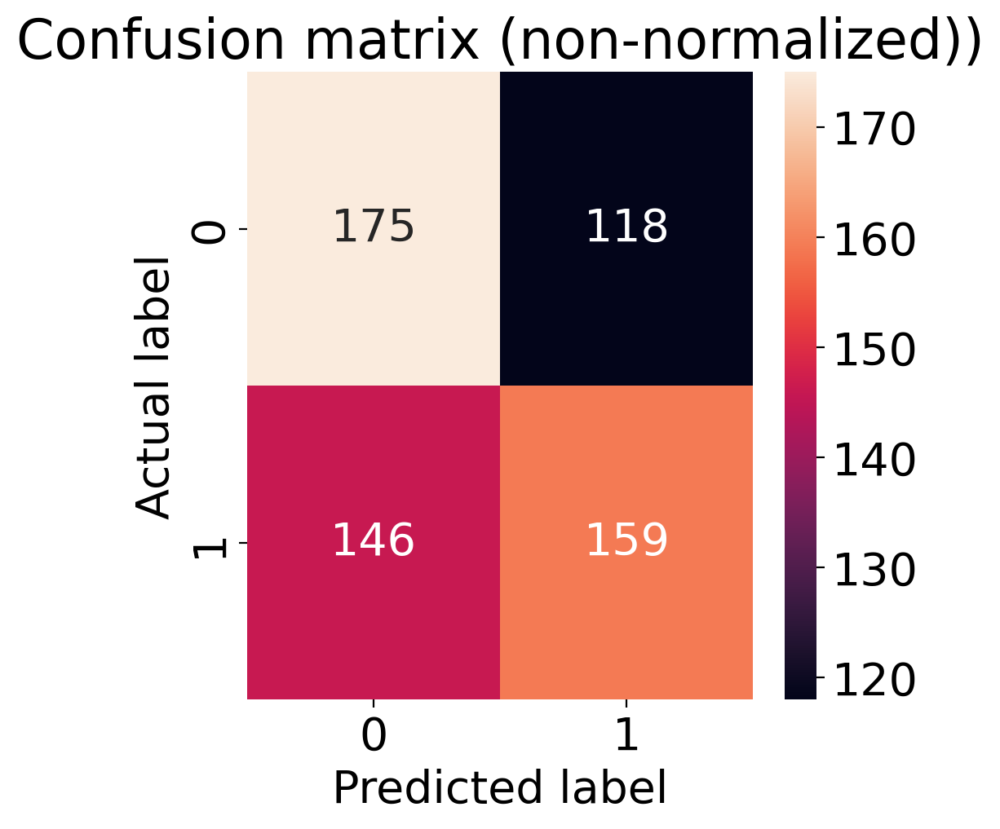

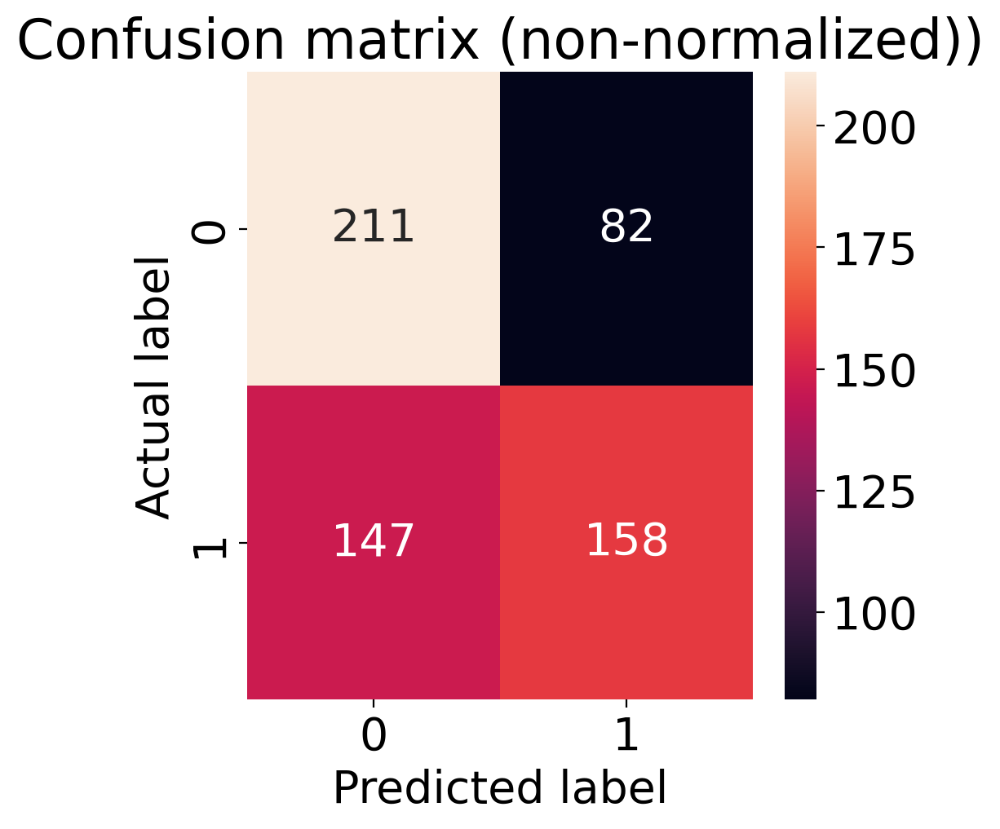

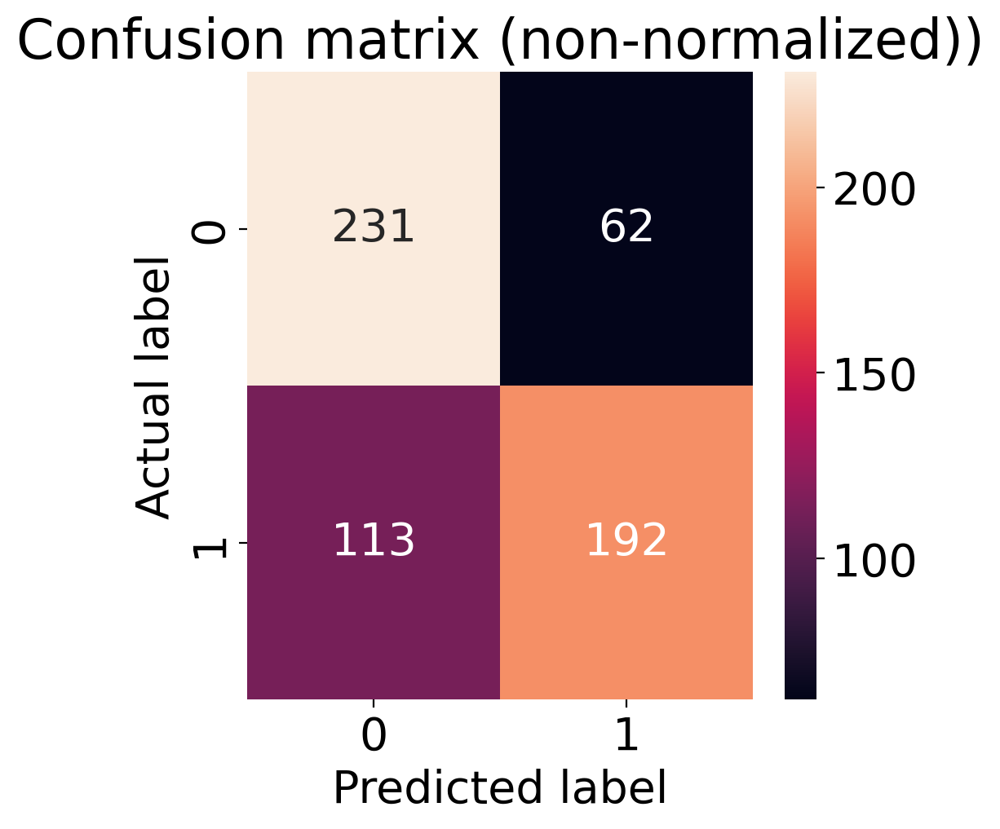

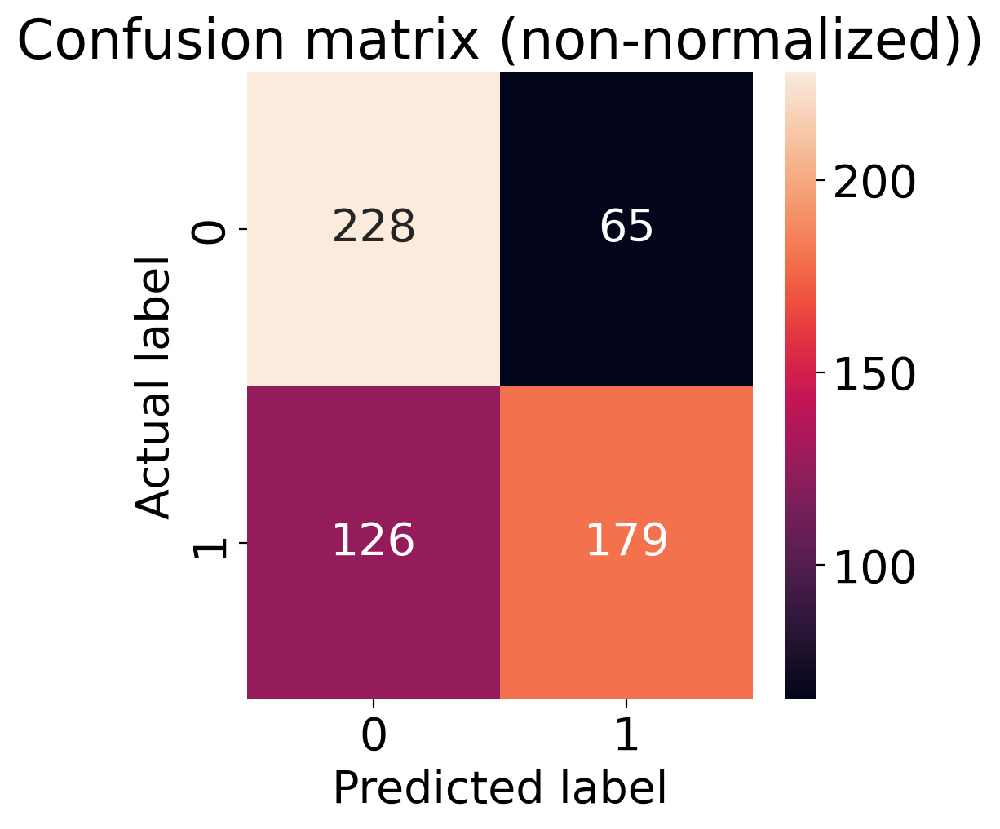

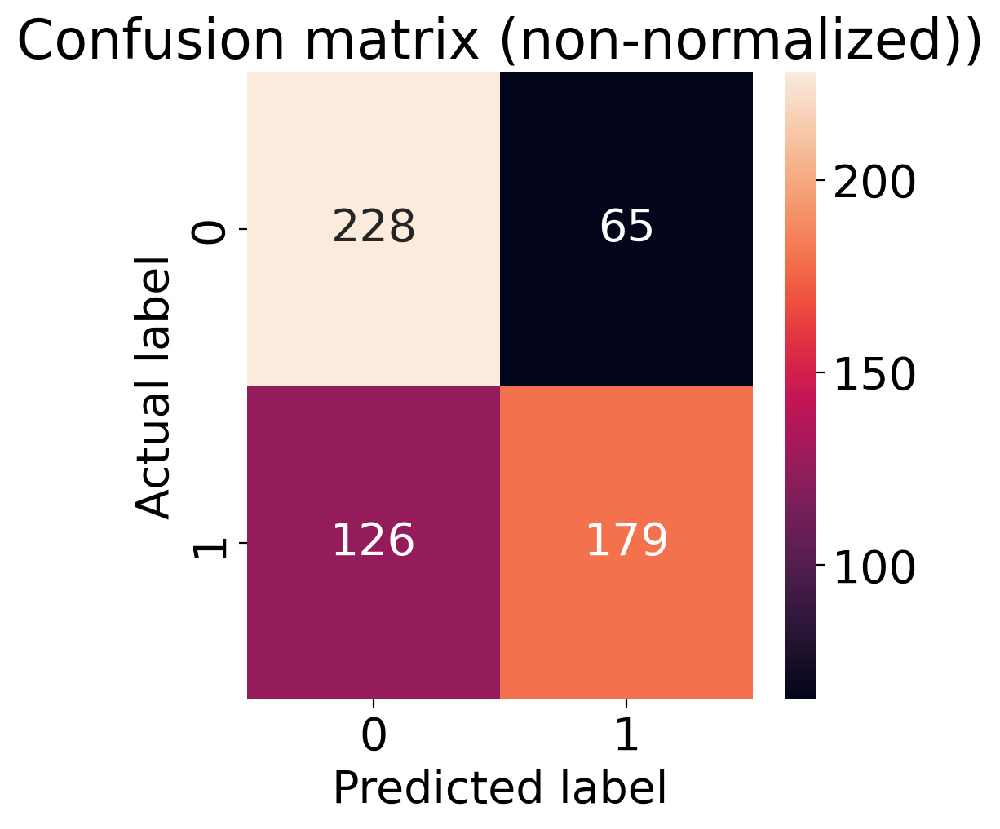

...

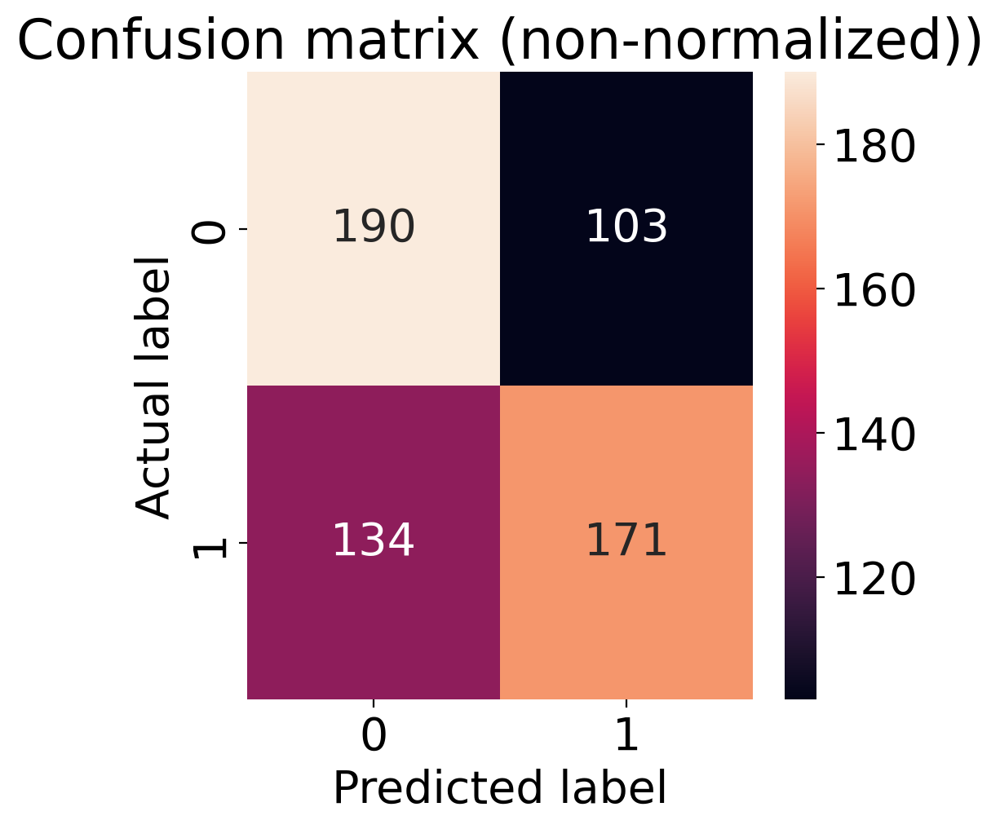

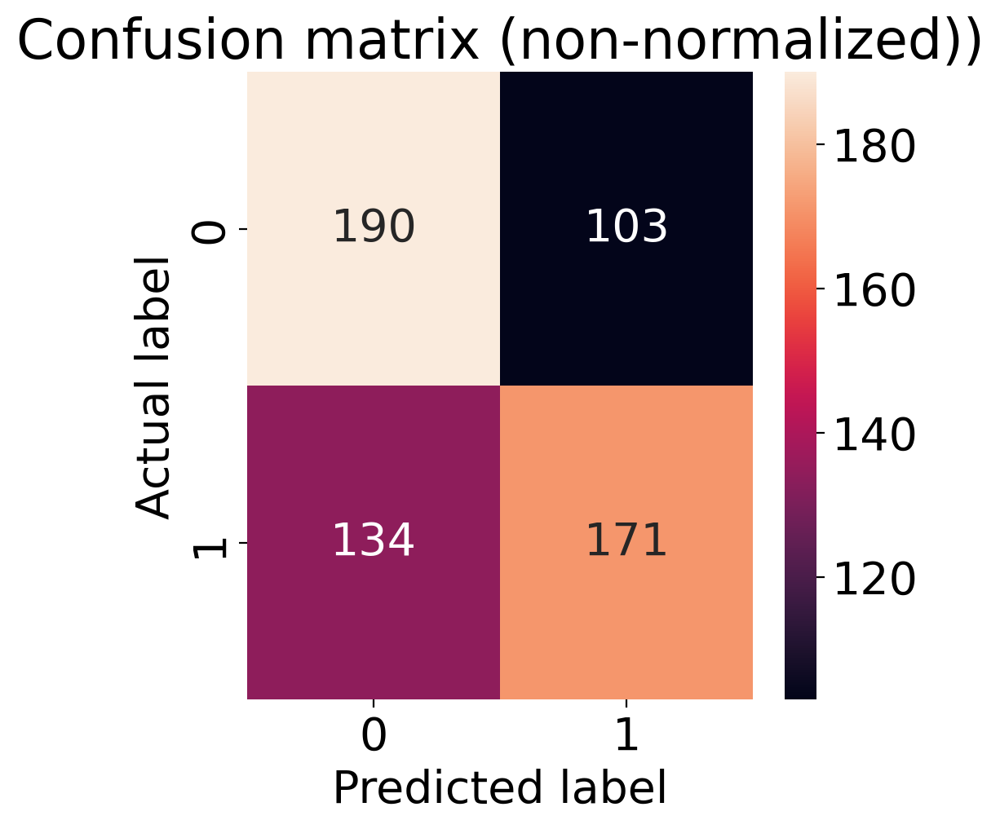

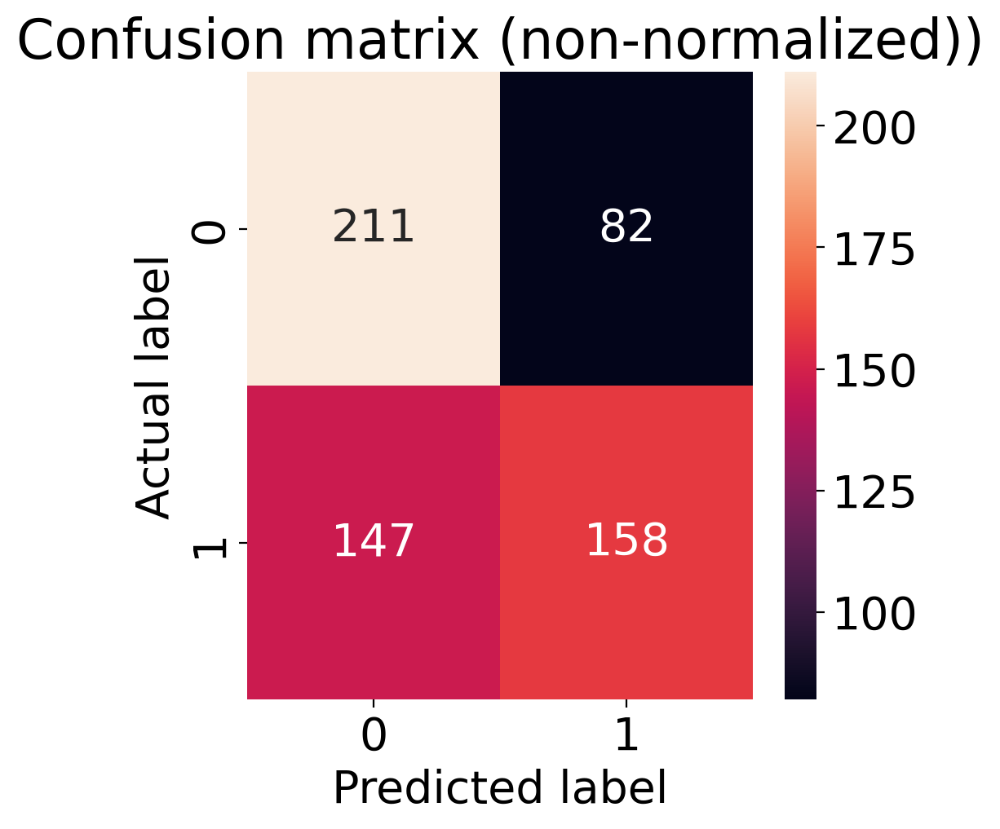

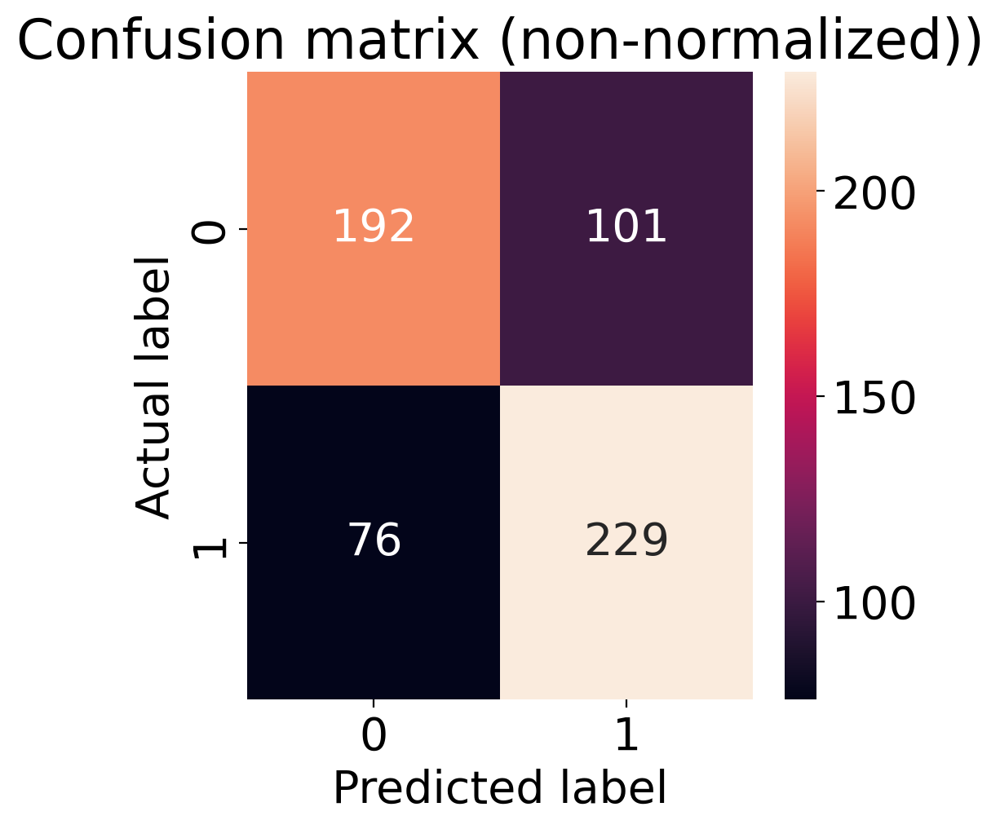

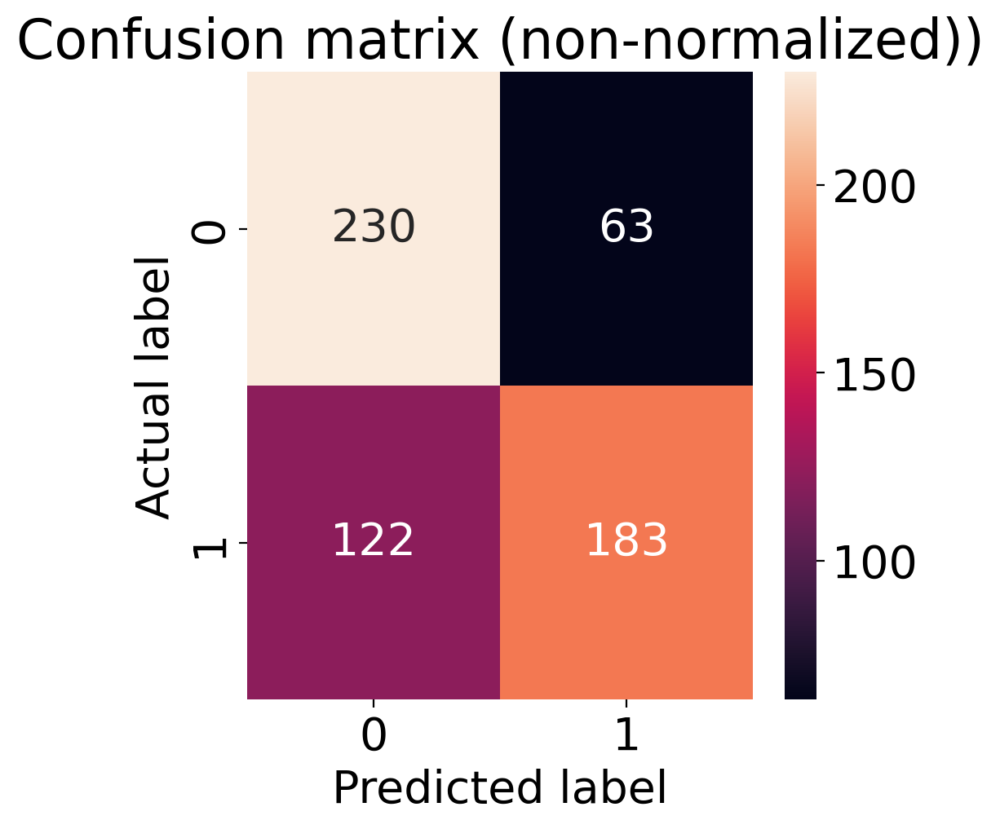

In [185]:
gaze_feat_size = int(((feat_dim - 768)/14))
print(gaze_feat_size)

B_cm_dict, B_result_dict, B_prediction_dict= dict(), dict(), dict()
BG_cm_dict, BG_result_dict, BG_prediction_dict= dict(), dict(), dict()
BR_cm_dict, BR_result_dict, BR_prediction_dict= dict(), dict(), dict()
BRG_cm_dict, BRG_result_dict, BRG_prediction_dict= dict(), dict(), dict()
BGR_cm_dict, BGR_result_dict,BGR_prediction_dict= dict(), dict(), dict()
BGPlus_cm_dict, BGPlus_result_dict, BGPlus_prediction_dict= dict(), dict(), dict()
BRGPlus_cm_dict, BRGPlus_result_dict, BRGPlus_prediction_dict= dict(), dict(), dict()
BGPlusR_cm_dict, BGPlusR_result_dict, BGPlusR_prediction_dict= dict(), dict(), dict()


variations= ['Bert', 'Bert+Gaze', 'Bert+Rationale', 'Bert+Rationale+Gaze', 'Bert+Gaze+Rationale', 'Bert+GazePlus', 'Bert+Rationale+GazePlus', 'Bert+GazePlus+Rationale']

for i in range(gaze_feat_size-1): # +1 to include the initial full model
    
    print(i, 'individual gaze feature : ', all_gaze_features[i])
    
    B_train_X, BG_train_X, BR_train_X, BRG_train_X, BGR_train_X = individual_cont(train_X, i)
    B_test_X, BG_test_X, BR_test_X, BRG_test_X, BGR_test_X = individual_cont(test_X, i)
    B_val_X, BG_val_X, BR_val_X, BRG_val_X, BGR_val_X = individual_cont(val_X, i)
    
    BGPlus_train_X, BRGPlus_train_X, BGPlusR_train_X = get_gaze_selected_split_X(train_X, gaze_selection,num_gaze_features)
    BGPlus_test_X, BRGPlus_test_X, BGPlusR_test_X = get_gaze_selected_split_X(test_X, gaze_selection,num_gaze_features)
    BGPlus_val_X, BRGPlus_val_X, BGPlusR_val_X = get_gaze_selected_split_X(val_X, gaze_selection,num_gaze_features)

                                                            
    B_cm_dict, B_result_dict, B_prediction_dict = run_report_MLC(i, B_train_X, train_Y, B_test_X, test_Y, B_cm_dict, B_result_dict, B_prediction_dict,all_gaze_features[i])
    BG_cm_dict, BG_result_dict, BG_prediction_dict = run_report_MLC(i, BG_train_X, train_Y, BG_test_X, test_Y, BG_cm_dict, BG_result_dict, BG_prediction_dict, all_gaze_features[i])
    BR_cm_dict, BR_result_dict, BR_prediction_dict = run_report_MLC(i, BR_train_X, train_Y, BR_test_X, test_Y, BR_cm_dict, BR_result_dict, BR_prediction_dict, all_gaze_features[i])
    BRG_cm_dict, BRG_result_dict, BRG_prediction_dict = run_report_MLC(i, BRG_train_X, train_Y,BRG_test_X, test_Y, BRG_cm_dict, BRG_result_dict, BRG_prediction_dict, all_gaze_features[i])
    BGR_cm_dict, BGR_result_dict, BGR_prediction_dict = run_report_MLC(i, BGR_train_X, train_Y, BGR_test_X, test_Y, BGR_cm_dict, BGR_result_dict, BGR_prediction_dict,all_gaze_features[i])

    BGPlus_cm_dict, BGPlus_result_dict, BGPlus_prediction_dict = run_report_MLC(i, BGPlus_train_X, train_Y, BGPlus_test_X, test_Y, BGPlus_cm_dict, BGPlus_result_dict, BGPlus_prediction_dict,'BGPlus')
    BRGPlus_cm_dict, BRGPlus_result_dict, BRGPlus_prediction_dict = run_report_MLC(i, BRGPlus_train_X, train_Y, BRGPlus_test_X, test_Y, BRGPlus_cm_dict, BRGPlus_result_dict, BRGPlus_prediction_dict,'BRGPlus')
    BGPlusR_cm_dict, BGPlusR_result_dict, BGPlusR_prediction_dict = run_report_MLC(i, BGPlusR_train_X, train_Y, BGPlusR_test_X, test_Y, BGPlusR_cm_dict, BGPlusR_result_dict, BGPlusR_prediction_dict,'BGPlusR')



In [186]:
B_result_dict

{'IA_FIXATION_%': {'0': {'precision': 0.5451713395638629,
   'recall': 0.5972696245733788,
   'f1-score': 0.5700325732899023,
   'support': 293.0},
  '1': {'precision': 0.5740072202166066,
   'recall': 0.521311475409836,
   'f1-score': 0.5463917525773195,
   'support': 305.0},
  'accuracy': 0.5585284280936454,
  'macro avg': {'precision': 0.5595892798902347,
   'recall': 0.5592905499916074,
   'f1-score': 0.558212162933611,
   'support': 598.0},
  'weighted avg': {'precision': 0.5598786031074863,
   'recall': 0.5585284280936454,
   'f1-score': 0.557974964063585,
   'support': 598.0}},
 'IA_RUN_COUNT': {'0': {'precision': 0.5451713395638629,
   'recall': 0.5972696245733788,
   'f1-score': 0.5700325732899023,
   'support': 293.0},
  '1': {'precision': 0.5740072202166066,
   'recall': 0.521311475409836,
   'f1-score': 0.5463917525773195,
   'support': 305.0},
  'accuracy': 0.5585284280936454,
  'macro avg': {'precision': 0.5595892798902347,
   'recall': 0.5592905499916074,
   'f1-score': 

In [187]:
B_cm_df= pd.DataFrame(B_cm_dict).T.reset_index()[::-1]

BG_cm_df= pd.DataFrame(BG_cm_dict).T.reset_index()[::-1]
BR_cm_df= pd.DataFrame(BR_cm_dict).T.reset_index()[::-1]
BGR_cm_df= pd.DataFrame(BGR_cm_dict).T.reset_index()[::-1]
BRG_cm_df= pd.DataFrame(BRG_cm_dict).T.reset_index()[::-1]

BGPlus_cm_df= pd.DataFrame(BGPlus_cm_dict).T.reset_index()[::-1]
BRGPlus_cm_df= pd.DataFrame(BRGPlus_cm_dict).T.reset_index()[::-1]
BGPlusR_cm_df= pd.DataFrame(BGPlusR_cm_dict).T.reset_index()[::-1]

BG_cm_df.to_csv('BG_cm_df_'+condition + '_' + path + '_' + bert_type +'_'+y_col+'_MLP_feature_based_hate_cm.csv', index=False)
BR_cm_df.to_csv('BR_cm_df_'+condition + '_' + path + '_' + bert_type +'_'+y_col+'_MLP_feature_based_hate_cm.csv', index=False)
BGR_cm_df.to_csv('BGR_cm_df'+condition + '_' + path + '_' + bert_type +'_'+y_col+'_MLP_feature_based_hate_cm.csv', index=False)
BRG_cm_df.to_csv('BRG_cm_df'+condition + '_' + path + '_' + bert_type +'_'+y_col+'_MLP_feature_based_hate_cm.csv', index=False)
BGPlus_cm_df.to_csv('BGPlus_cm_df'+condition + '_' + path + '_' + bert_type +'_'+y_col+'_MLP_feature_based_hate_cm.csv', index=False)
BRGPlus_cm_df.to_csv('BRGPlus_cm_df'+condition + '_' + path + '_' + bert_type +'_'+y_col+'_MLP_feature_based_hate_cm.csv', index=False)
BGPlusR_cm_df.to_csv('BGPlusR_cm_df'+condition + '_' + path + '_' + bert_type +'_'+y_col+'_MLP_feature_based_hate_cm.csv', index=False)



In [188]:
def results_dict_to_df(result_dict, variation):
    print(result_dict)
    result_df= pd.DataFrame(result_dict).T.reset_index()
    print('processing the variation: ', variation)

    cols= ['feature', 'accuracy', 'macro_f1', 'hate_f1', 'nohate_f1']
    ## that is super bulky ':)

    result_stat=pd.DataFrame(columns=cols)

    for index, row in result_df.iterrows():
        feat= row['index']
        acc= row['accuracy']
        macro_f1 = row['macro avg']['f1-score']
        hate_f1 = row['1']['f1-score']
        nohate_f1 = row['0']['f1-score']

        result_stat.at[index,'feature' ] = feat
        result_stat.at[index,'accuracy' ] = acc
        result_stat.at[index,'macro_f1' ] = macro_f1
        result_stat.at[index,'hate_f1' ] = hate_f1
        result_stat.at[index,'nohate_f1' ] = nohate_f1
    
    result_stat_rv = result_stat[::-1]

    #print(result_stat_rv)
    return result_stat_rv 

# ['Bert+Gaze', 'Bert+Rationale', 'Bert+Rationale+Gaze', 'Bert+Gaze+Rationale']

B_result_stats = results_dict_to_df(B_result_dict, variations[0])
BG_result_stats = results_dict_to_df(BG_result_dict, variations[1])
BR_result_stats = results_dict_to_df(BR_result_dict, variations[2])
BRG_result_stats = results_dict_to_df(BRG_result_dict, variations[3])
BGR_result_stats = results_dict_to_df(BGR_result_dict, variations[4])
BGPlus_result_stats = results_dict_to_df(BGPlus_result_dict, variations[5])
BRGPlus_result_stats = results_dict_to_df(BRGPlus_result_dict, variations[6])
BGPlusR_result_stats = results_dict_to_df(BGPlusR_result_dict, variations[7])

B_result_stats.to_csv('stats/'+variations[0]+'_'+condition + '_' + path + '_' + bert_type+'_MLP_feature_based_hate_results.csv', index=False)      
BG_result_stats.to_csv('stats/'+variations[1]+'_'+condition + '_' + path + '_' + bert_type+'_MLP_feature_based_hate_results.csv', index=False)    
BR_result_stats.to_csv('stats/'+variations[2]+'_'+condition + '_' + path + '_' + bert_type+'_MLP_feature_based_hate_results.csv', index=False) 
BRG_result_stats.to_csv('stats/'+variations[3]+'_'+condition + '_' + path + '_' + bert_type+'_MLP_feature_based_hate_results.csv', index=False) 
BGR_result_stats.to_csv('stats/'+variations[4]+'_'+condition + '_' + path + '_' + bert_type+'_MLP_feature_based_hate_results.csv', index=False) 
BGPlus_result_stats.to_csv('stats/'+variations[5]+'_'+condition + '_' + path + '_' + bert_type+'_MLP_feature_based_hate_results.csv', index=False) 
BRGPlus_result_stats.to_csv('stats/'+variations[6]+'_'+condition + '_' + path + '_' + bert_type+'_MLP_feature_based_hate_results.csv', index=False) 
BGPlusR_result_stats.to_csv('stats/'+variations[7]+'_'+condition + '_' + path + '_' + bert_type+'_MLP_feature_based_hate_results.csv', index=False)    

{'IA_FIXATION_%': {'0': {'precision': 0.5451713395638629, 'recall': 0.5972696245733788, 'f1-score': 0.5700325732899023, 'support': 293.0}, '1': {'precision': 0.5740072202166066, 'recall': 0.521311475409836, 'f1-score': 0.5463917525773195, 'support': 305.0}, 'accuracy': 0.5585284280936454, 'macro avg': {'precision': 0.5595892798902347, 'recall': 0.5592905499916074, 'f1-score': 0.558212162933611, 'support': 598.0}, 'weighted avg': {'precision': 0.5598786031074863, 'recall': 0.5585284280936454, 'f1-score': 0.557974964063585, 'support': 598.0}}, 'IA_RUN_COUNT': {'0': {'precision': 0.5451713395638629, 'recall': 0.5972696245733788, 'f1-score': 0.5700325732899023, 'support': 293.0}, '1': {'precision': 0.5740072202166066, 'recall': 0.521311475409836, 'f1-score': 0.5463917525773195, 'support': 305.0}, 'accuracy': 0.5585284280936454, 'macro avg': {'precision': 0.5595892798902347, 'recall': 0.5592905499916074, 'f1-score': 0.558212162933611, 'support': 598.0}, 'weighted avg': {'precision': 0.55987

In [189]:
B_result_stats

,feature,accuracy,macro_f1,hate_f1,nohate_f1
16,IA_SKIP,0.558528,0.558212,0.546392,0.570033
15,IA_REGRESSION_OUT,0.558528,0.558212,0.546392,0.570033
14,IA_REGRESSION_IN,0.558528,0.558212,0.546392,0.570033
13,total_reg_count,0.558528,0.558212,0.546392,0.570033
12,forward_reg_count,0.558528,0.558212,0.546392,0.570033
11,backward_reg_count,0.558528,0.558212,0.546392,0.570033
10,IA_REGRESSION_OUT_COUNT,0.558528,0.558212,0.546392,0.570033
9,IA_REGRESSION_IN_COUNT,0.558528,0.558212,0.546392,0.570033
8,IA_FIRST_RUN_FIXATION_%,0.558528,0.558212,0.546392,0.570033
7,IA_FIRST_FIXATION_DURATION,0.558528,0.558212,0.546392,0.570033


In [190]:
BR_result_stats

,feature,accuracy,macro_f1,hate_f1,nohate_f1
16,IA_SKIP,0.707358,0.706108,0.686941,0.725275
15,IA_REGRESSION_OUT,0.707358,0.706108,0.686941,0.725275
14,IA_REGRESSION_IN,0.707358,0.706108,0.686941,0.725275
13,total_reg_count,0.707358,0.706108,0.686941,0.725275
12,forward_reg_count,0.707358,0.706108,0.686941,0.725275
11,backward_reg_count,0.707358,0.706108,0.686941,0.725275
10,IA_REGRESSION_OUT_COUNT,0.707358,0.706108,0.686941,0.725275
9,IA_REGRESSION_IN_COUNT,0.707358,0.706108,0.686941,0.725275
8,IA_FIRST_RUN_FIXATION_%,0.707358,0.706108,0.686941,0.725275
7,IA_FIRST_FIXATION_DURATION,0.707358,0.706108,0.686941,0.725275


In [191]:
BG_result_stats

,feature,accuracy,macro_f1,hate_f1,nohate_f1
16,IA_SKIP,0.64214,0.635619,0.586873,0.684366
15,IA_REGRESSION_OUT,0.617057,0.614025,0.579817,0.648233
14,IA_REGRESSION_IN,0.625418,0.623735,0.598566,0.648903
13,total_reg_count,0.622074,0.61873,0.583026,0.654434
12,forward_reg_count,0.632107,0.628109,0.589552,0.666667
11,backward_reg_count,0.623746,0.620296,0.584104,0.656489
10,IA_REGRESSION_OUT_COUNT,0.643813,0.637486,0.589595,0.685377
9,IA_REGRESSION_IN_COUNT,0.617057,0.614025,0.579817,0.648233
8,IA_FIRST_RUN_FIXATION_%,0.617057,0.614025,0.579817,0.648233
7,IA_FIRST_FIXATION_DURATION,0.648829,0.641413,0.589844,0.692982


In [192]:
BRG_result_stats

,feature,accuracy,macro_f1,hate_f1,nohate_f1
16,IA_SKIP,0.603679,0.603278,0.590674,0.615883
15,IA_REGRESSION_OUT,0.720736,0.720322,0.709565,0.731079
14,IA_REGRESSION_IN,0.648829,0.645258,0.680851,0.609665
13,total_reg_count,0.690635,0.690253,0.701131,0.679376
12,forward_reg_count,0.719064,0.717242,0.694545,0.739938
11,backward_reg_count,0.668896,0.666749,0.693498,0.64
10,IA_REGRESSION_OUT_COUNT,0.66388,0.663465,0.651646,0.675283
9,IA_REGRESSION_IN_COUNT,0.712375,0.711649,0.726115,0.697183
8,IA_FIRST_RUN_FIXATION_%,0.704013,0.702876,0.72126,0.684492
7,IA_FIRST_FIXATION_DURATION,0.665552,0.665458,0.659864,0.671053


In [193]:
BGPlus_result_stats

,feature,accuracy,macro_f1,hate_f1,nohate_f1
0,BGPlus,0.617057,0.614025,0.579817,0.648233


In [194]:
BRGPlus_result_stats

,feature,accuracy,macro_f1,hate_f1,nohate_f1
0,BRGPlus,0.704013,0.702876,0.72126,0.684492


In [195]:
BGPlusR_result_stats

,feature,accuracy,macro_f1,hate_f1,nohate_f1
0,BGPlusR,0.690635,0.688713,0.664247,0.713178


-------------------------------------------

<function matplotlib.pyplot.show(close=None, block=None)>

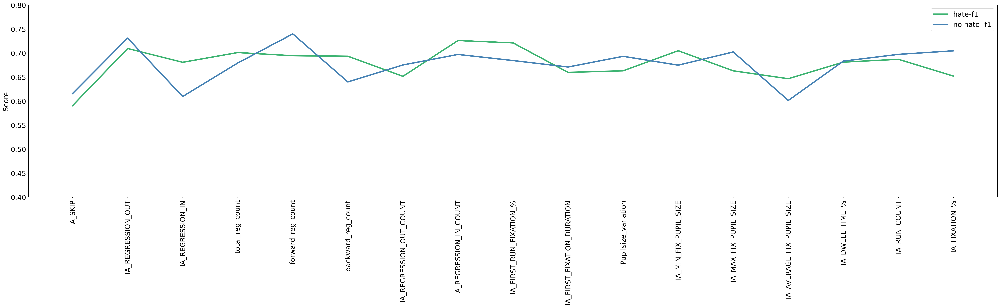

In [196]:
hate_values = BRG_result_stats['hate_f1'].values.tolist()
nohate_values = BRG_result_stats['nohate_f1'].values.tolist()
#macrof1_values = result_stat_rv['macro_f1'].values.tolist()
x_labels = BRG_result_stats['feature'].values.tolist()

# setting font sizeto 20
plt.rcParams.update({'font.size': 20})
# 'mediumseagreen', 'steelblue'
line1 = plt.plot(x_labels, hate_values,color= 'mediumseagreen',label='hate-f1',linewidth=4.0)
line2 = plt.plot(x_labels, nohate_values,color= 'steelblue',label='no hate -f1',linewidth=4.0)
#line3 = plt.plot(x_labels, macrof1_values,color= 'orange',label='macro f1',linewidth=4.0)
#plt.xlabel('xlabel', fontsize=20)
plt.ylabel('Score', fontsize=20)
plt.xticks(rotation=90)
plt.ylim(0.40, 0.80)
plt.legend()
plt.show
#plt.savefig('fig/MLP_feature_based_hate_'+condition+'_'+bert_type+'_'+path+'.png', bbox_inches='tight')

------------------------------------
## McNemar test

In [197]:
#https://machinelearningmastery.com/mcnemars-test-for-machine-learning/
import statsmodels.api as sm
from statsmodels.stats.contingency_tables import mcnemar

In [198]:
B_cm_df
B_cm_df['neg'] = B_cm_df['fp']+ B_cm_df['fn']
B_cm_df['pos'] = B_cm_df['tp']+ B_cm_df['tn']

B_cm_df

,index,tn,fp,fn,tp,neg,pos
16,IA_SKIP,175,118,146,159,264,334
15,IA_REGRESSION_OUT,175,118,146,159,264,334
14,IA_REGRESSION_IN,175,118,146,159,264,334
13,total_reg_count,175,118,146,159,264,334
12,forward_reg_count,175,118,146,159,264,334
11,backward_reg_count,175,118,146,159,264,334
10,IA_REGRESSION_OUT_COUNT,175,118,146,159,264,334
9,IA_REGRESSION_IN_COUNT,175,118,146,159,264,334
8,IA_FIRST_RUN_FIXATION_%,175,118,146,159,264,334
7,IA_FIRST_FIXATION_DURATION,175,118,146,159,264,334


In [199]:
BG_cm_df['neg'] = BG_cm_df['fp']+ BG_cm_df['fn']
BG_cm_df['pos'] = BG_cm_df['tp']+ BG_cm_df['tn']
BG_cm_df

,index,tn,fp,fn,tp,neg,pos
16,IA_SKIP,232,61,153,152,214,384
15,IA_REGRESSION_OUT,211,82,147,158,229,369
14,IA_REGRESSION_IN,207,86,138,167,224,374
13,total_reg_count,214,79,147,158,226,372
12,forward_reg_count,220,73,147,158,220,378
11,backward_reg_count,215,78,147,158,225,373
10,IA_REGRESSION_OUT_COUNT,232,61,152,153,213,385
9,IA_REGRESSION_IN_COUNT,211,82,147,158,229,369
8,IA_FIRST_RUN_FIXATION_%,211,82,147,158,229,369
7,IA_FIRST_FIXATION_DURATION,237,56,154,151,210,388


In [200]:
BR_cm_df['neg'] = BR_cm_df['fp']+ BR_cm_df['fn']
BR_cm_df['pos'] = BR_cm_df['tp']+ BR_cm_df['tn']
BR_cm_df

,index,tn,fp,fn,tp,neg,pos
16,IA_SKIP,231,62,113,192,175,423
15,IA_REGRESSION_OUT,231,62,113,192,175,423
14,IA_REGRESSION_IN,231,62,113,192,175,423
13,total_reg_count,231,62,113,192,175,423
12,forward_reg_count,231,62,113,192,175,423
11,backward_reg_count,231,62,113,192,175,423
10,IA_REGRESSION_OUT_COUNT,231,62,113,192,175,423
9,IA_REGRESSION_IN_COUNT,231,62,113,192,175,423
8,IA_FIRST_RUN_FIXATION_%,231,62,113,192,175,423
7,IA_FIRST_FIXATION_DURATION,231,62,113,192,175,423


In [201]:
BRG_cm_df['neg'] = BRG_cm_df['fp']+ BRG_cm_df['fn']
BRG_cm_df['pos'] = BRG_cm_df['tp']+ BRG_cm_df['tn']

BRG_cm_df

,index,tn,fp,fn,tp,neg,pos
16,IA_SKIP,190,103,134,171,237,361
15,IA_REGRESSION_OUT,227,66,101,204,167,431
14,IA_REGRESSION_IN,164,129,81,224,210,388
13,total_reg_count,196,97,88,217,185,413
12,forward_reg_count,239,54,114,191,168,430
11,backward_reg_count,176,117,81,224,198,400
10,IA_REGRESSION_OUT_COUNT,209,84,117,188,201,397
9,IA_REGRESSION_IN_COUNT,198,95,77,228,172,426
8,IA_FIRST_RUN_FIXATION_%,192,101,76,229,177,421
7,IA_FIRST_FIXATION_DURATION,204,89,111,194,200,398


In [202]:
BRGPlus_cm_df['neg'] = BRGPlus_cm_df['fp']+ BRGPlus_cm_df['fn']
BRGPlus_cm_df['pos'] = BRGPlus_cm_df['tp']+ BRGPlus_cm_df['tn']

BRGPlus_cm_df

,index,tn,fp,fn,tp,neg,pos
0,BRGPlus,192,101,76,229,177,421


In [203]:
### in general, it might be statistically more meaningful to check whether the models are making difference on the wrong predictions,
### but first we might check whether they are statistically differnt in terms of positives and negatives , or what do you think?

In [204]:
all_items= len(BG_prediction_dict['IA_FIXATION_%'])
print(all_items)
bert_only_neg=  B_cm_df.loc[B_cm_df['index']=='IA_FIXATION_%', 'neg'].values[0]
bert_only_pos=  B_cm_df.loc[B_cm_df['index']=='IA_FIXATION_%', 'pos'].values[0]
bert_only_neg, bert_only_pos 

598


(264, 334)

In [205]:
bg_1st_run_fix_neg=  BG_cm_df.loc[BG_cm_df['index']=='IA_FIRST_RUN_FIXATION_%', 'neg'].values[0]#*100/all_items
bg_1st_run_fix_pos=  BG_cm_df.loc[BG_cm_df['index']=='IA_FIRST_RUN_FIXATION_%', 'pos'].values[0]#*100/all_items
bg_1st_run_fix_neg, bg_1st_run_fix_pos

(229, 369)

In [206]:
brg_neg=  BRG_cm_df.loc[BRG_cm_df['index']=='IA_FIRST_RUN_FIXATION_%', 'neg'].values[0]
brg_pos=  BRG_cm_df.loc[BRG_cm_df['index']=='IA_FIRST_RUN_FIXATION_%', 'pos'].values[0]
brg_neg, brg_pos


(177, 421)

In [207]:
br_neg=  BR_cm_df.loc[BR_cm_df['index']=='IA_FIRST_RUN_FIXATION_%', 'neg'].values[0]
br_pos=  BR_cm_df.loc[BR_cm_df['index']=='IA_FIRST_RUN_FIXATION_%', 'pos'].values[0]
br_neg, br_pos

(175, 423)

In [208]:
# E-only versus EG (on 1st run fixation count)
# define contingency table
table = [[bert_only_neg, bert_only_pos ],[bg_1st_run_fix_neg, bg_1st_run_fix_pos]]
print(table)
print(mcnemar(table, exact=False)) # Alternately, if all cells used in the calculation of the test statistic in the contingency table have a value of 25 or more, then the standard calculation of the test can be used.


[[264, 334], [229, 369]]
pvalue      1.1701450528025026e-05
statistic   19.211367673179396


In [209]:
# E-only versus ER 
# define contingency table
table = [[bert_only_neg, bert_only_pos ],[br_neg, br_pos]]
print(table)
print(mcnemar(table, exact=False)) # Alternately, if all cells used in the calculation of the test statistic in the contingency table have a value of 25 or more, then the standard calculation of the test can be used.
#otherwise
#print(mcnemar(table, exact=True))

[[264, 334], [175, 423]]
pvalue      2.501332851014873e-12
statistic   49.04518664047151


In [210]:
# E-only versus BRG 
# define contingency table
table = [[bert_only_neg, bert_only_pos ],[brg_neg, brg_pos]]
print(table)
print(mcnemar(table, exact=False)) # Alternately, if all cells used in the calculation of the test statistic in the contingency table have a value of 25 or more, then the standard calculation of the test can be used.
#otherwise
#print(mcnemar(table, exact=True))

[[264, 334], [177, 421]]
pvalue      5.1625482350826045e-12
statistic   47.62426614481409


In [211]:
# EG-only versus ER 
# define contingency table
table = [[bg_1st_run_fix_neg, bg_1st_run_fix_pos],[br_neg, br_pos]]
print(table)
print(mcnemar(table, exact=False)) # Alternately, if all cells used in the calculation of the test statistic in the contingency table have a value of 25 or more, then the standard calculation of the test can be used.
#otherwise
#print(mcnemar(table, exact=True))

[[229, 369], [175, 423]]
pvalue      1.2866414135260452e-16
statistic   68.47242647058823


In [213]:
### finetune versus base EG-only 
# define contingency table
table = [[159,439],[229,369]]
print(table)
print(mcnemar(table, exact=False)) # Alternately, if all cells used in the calculation of the test statistic in the contingency table have a value of 25 or more, then the standard calculation of the test can be used.
#otherwise
#print(mcnemar(table, exact=True))

[[159, 439], [229, 369]]
pvalue      6.142751673969144e-16
statistic   65.39071856287426


In [214]:
### finetune versus base E-only 
# define contingency table
table = [[197,401],[264,334]]
print(table)
print(mcnemar(table, exact=False)) # Alternately, if all cells used in the calculation of the test statistic in the contingency table have a value of 25 or more, then the standard calculation of the test can be used.
#otherwise
#print(mcnemar(table, exact=True))

[[197, 401], [264, 334]]
pvalue      1.335883470992942e-07
statistic   27.813533834586465


In [216]:
### finetune versus base ER-only 
# define contingency table
table = [[236,362],[177,421]]
print(table)
print(mcnemar(table, exact=False)) # Alternately, if all cells used in the calculation of the test statistic in the contingency table have a value of 25 or more, then the standard calculation of the test can be used.
#otherwise
#print(mcnemar(table, exact=True))

[[236, 362], [177, 421]]
pvalue      2.2733796594304187e-15
statistic   62.8126159554731


In [217]:
### finetune versus base EGR-only 
# define contingency table
table = [[201,397],[175,423]]
print(table)
print(mcnemar(table, exact=False)) # Alternately, if all cells used in the calculation of the test statistic in the contingency table have a value of 25 or more, then the standard calculation of the test can be used.
#otherwise
#print(mcnemar(table, exact=True))

[[201, 397], [175, 423]]
pvalue      2.4540717831105347e-20
statistic   85.38636363636364
